# 7. Explainable Artificial Intelligence
This section handles the exploration of different XAI methods on this specific dataset.

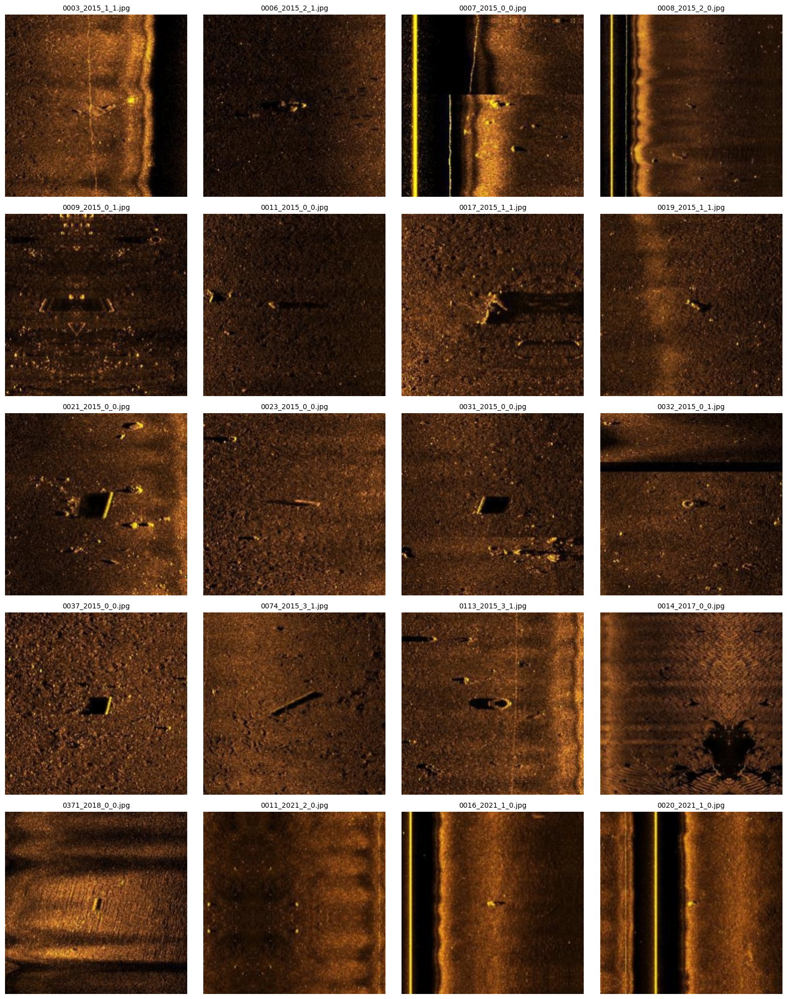

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

def crop_image(image_path, size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - size) // 2
    return image[start:start+size, start:start+size]

# List of 20 image paths
image_paths = [
    "/content/data/output/0003_2015_1_1.jpg", "/content/data/output/0006_2015_2_1.jpg",
    "/content/data/output/0007_2015_0_0.jpg", "/content/data/output/0008_2015_2_0.jpg",
    "/content/data/output/0009_2015_0_1.jpg", "/content/data/output/0011_2015_0_0.jpg",
    "/content/data/output/0017_2015_1_1.jpg", "/content/data/output/0019_2015_1_1.jpg",
    "/content/data/output/0021_2015_0_0.jpg", "/content/data/output/0023_2015_0_0.jpg",
    "/content/data/output/0031_2015_0_0.jpg", "/content/data/output/0032_2015_0_1.jpg",
    "/content/data/output/0037_2015_0_0.jpg", "/content/data/output/0074_2015_3_1.jpg",
    "/content/data/output/0113_2015_3_1.jpg", "/content/data/output/0014_2017_0_0.jpg",
    "/content/data/output/0371_2018_0_0.jpg", "/content/data/output/0011_2021_2_0.jpg",
    "/content/data/output/0016_2021_1_0.jpg", "/content/data/output/0020_2021_1_0.jpg"
]

# Create grid
fig, axes = plt.subplots(5, 4, figsize=(16, 20))

for ax, image_path in zip(axes.flat, image_paths):
    image = crop_image(image_path)
    filename = os.path.basename(image_path)

    ax.imshow(image)
    ax.set_title(filename, fontsize=10)
    ax.axis("off")

plt.tight_layout()
plt.show()


## Local Interpretable Model-agnostic Explanations (LIME)

#### LIME using SLIC

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 843ms/step
Predicted class: 0
image shape: (240, 240, 3)
custom_background shape: (240, 240, 3)


  0%|          | 0/1500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

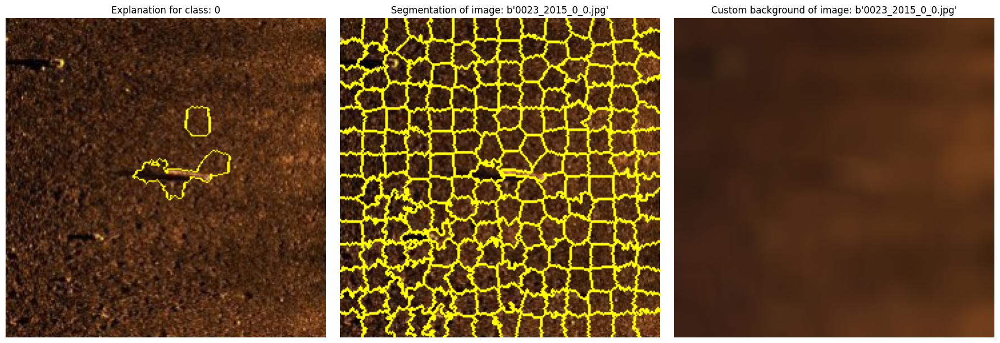

Intercept:  0.6883473320408589
Score:  0.6793290826464582
Local pred:  [1.06218169]
Explanation for predicted instance (class 0):
[(np.int64(86), np.float64(0.22831266302394954)), (np.int64(101), np.float64(0.09019512098786261)), (np.int64(96), np.float64(0.05463682335635301)), (np.int64(66), np.float64(0.01587052032219985)), (np.int64(71), np.float64(-0.015180765156064879))]


In [ ]:
from skimage.segmentation import slic
import sklearn

explainer = lime.lime_image.LimeImageExplainer(kernel_width=0.25)

def crop_image(x, size=240):
  image= cv2.imread(x)
  image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  start = (299-size) // 2
  cropped = image[start:start+size,start:start+size]
  return cropped

def predict_prob(images):
  return loaded_model.predict(images)

image_path = "/content/data/output/0023_2015_0_0.jpg"
#image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0031_2015_0_0.jpg"
#image_path = "/content/data/output/0007_2015_0_0.jpg"

rgb_img = crop_image(image_path)
grayscale_img = rgb_img # Use RGB

image_arr = img_to_array(grayscale_img).astype(np.float32)
image_arr = preprocess_input(image_arr)
input_tensor = np.expand_dims(image_arr,axis=0)

rgb_img_np = np.array(rgb_img).astype(np.float32) / 255.0

image_filename = tf.strings.split(image_path, os.path.sep)[-1]

prediction = loaded_model.predict(input_tensor)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

grayscale_img_np = grayscale_img.astype(np.float32) / 255.0
custom_background = cv2.GaussianBlur(grayscale_img_np, (25, 25), sigmaX=10)

# Re-check shapes clearly:
assert grayscale_img_np.shape == custom_background.shape, "Shapes mismatch!"

print("image shape:", grayscale_img.shape)
print("custom_background shape:", custom_background.shape)

segmentation_fn = lambda img: slic(img, n_segments=200,compactness=20)
segments = segmentation_fn(grayscale_img)

num_samples = 1500
data, labels = explainer.data_labels(image=grayscale_img_np,fudged_image=custom_background,segments=segments,classifier_fn=predict_prob,num_samples=num_samples)
#data, labels = explainer.data_labels(image=grayscale_img_np,fudged_image=none,segments=segments,classifier_fn=predict_prob,num_samples=num_samples)

distances = sklearn.metrics.pairwise_distances(
    data,
    data[0].reshape(1, -1),
    metric='cosine'
).ravel()

# Create explanation object
ret_exp = lime.lime_image.ImageExplanation(grayscale_img_np, segments)

intercept, local_exp, score, local_pred = explainer.base.explain_instance_with_data(
    data, labels, distances, predicted_class, num_features=5
)

ret_exp.intercept = {predicted_class: intercept}
ret_exp.local_exp = {predicted_class: local_exp}
ret_exp.score = score
ret_exp.local_pred = {predicted_class: local_pred}

img, mask = ret_exp.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    num_features=5,
    hide_rest=True
)

fix, ax = plt.subplots(1,3,figsize=(18,6))

ax[0].imshow(mark_boundaries(rgb_img_np, mask))
ax[0].set_title(f"Explanation for class: {predicted_class}")
ax[0].axis("off")

ax[1].imshow(mark_boundaries(rgb_img_np, segments))
ax[1].set_title(f"Segmentation of image: {image_filename}")
ax[1].axis("off")

ax[2].imshow(custom_background)
ax[2].set_title(f"Custom background of image: {image_filename}")
ax[2].axis("off")

plt.tight_layout()
plt.show()

print("Intercept: ",intercept)
print("Score: ",score)
print("Local pred: ", local_pred)

# Print explanation details explicitly
print(f"Explanation for predicted instance (class {predicted_class}):")
print(ret_exp.local_exp[predicted_class])

#### Segmentation methods: Quickshift (default of LIME), SLIC, Felzenszwalb and watershed

In [ ]:
!pip install pymeanshift

  Using cached pymeanshift-0.2.2.tar.gz (74 kB)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pymeanshift
  Running setup.py clean for pymeanshift
Failed to build pymeanshift
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pymeanshift)


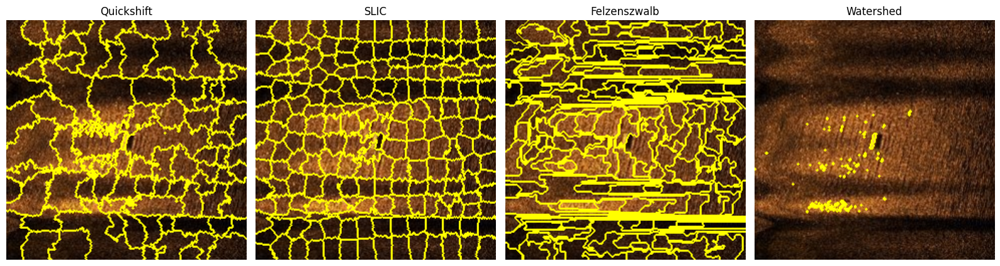

In [ ]:
from skimage.segmentation import quickshift, mark_boundaries, slic, felzenszwalb
from skimage.io import imread
from skimage import morphology, measure, segmentation, color, filters
from skimage.filters import sobel
from skimage.color import rgb2lab
#from pymeanshift import segment
from lime.wrappers.scikit_image import SegmentationAlgorithm

def crop_image(x, size=240):
  image= cv2.imread(x)
  image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  start = (299-size) // 2
  cropped = image[start:start+size,start:start+size]
  return cropped

#image_path = "/content/data/output/0023_2015_0_0.jpg"
image_path = "/content/data/output/0371_2018_0_0.jpg"

image= imread(image_path)
image = crop_image(image_path)
image_arr = img_to_array(image)
image_arr = preprocess_input(image_arr)

qs_segments = quickshift(image_arr, kernel_size=3, max_dist=100, ratio=0.2)

"""
kernel_size = determines the size of the gaussian kernel used to smooth the image before segmentation
--> a smaller kernel size preserves the fine details
max_dist = specifies the maximum distance (in the feature space) between pixels for them to be grouped together
--> a larger max_dist (like 200) allows pixels that are more dissimilar to be merged, potentially creating larger segments
ratio = balances the influence of color similarity versus spatial proximity when deciding whether pixels belong to the same segment
--> a lower ratio gives more weight to spatial proximity, typically resulting in more, finer segments, a higher ratio would let color similarity dominate
"""

slic_segments = slic(image_arr, n_segments=200, compactness=20)

"""
n_segments = sets the appropriate number of superpixels to generate
--> a higher number produces smaller, more detailed superpixels
compactness = controls how compact the superpixels are by balancing colors similarity and spatial proximity
--> a higher value forces superpixels to be more spatially compact and regular in shape
"""

felzenszwalb_segments = felzenszwalb(image_arr,scale=10, sigma=2, min_size=100)
"""
scale = influences the size of the segments
--> a larger scale value results in larger segments
sigma = controls the Gaussian smoothing applied to the image before segmentation
--> smoothing can help reduce noise and improve the segmentation quality
min_size =
"""

def watershed_segmentation(image):
  # Convert the image to grayscale
  gray = color.rgb2gray(image)

  #plt.figure()
  #plt.imshow(gray, cmap='gray')
  #plt.title("Grayscale Image")
  #plt.axis("off")

  # Compute the gradient of the image
  gradient = sobel(gray)

  #plt.figure()
  #plt.imshow(gradient, cmap='gray')
  #plt.title("Gradient Image")
  #plt.axis("off")

  # Apply the watershed algorithm
  markers = np.zeros_like(gray,dtype=np.int32)
  markers[gray < 0.2] = 1
  markers[gray > 0.2] = 2

  #plt.figure()
  #plt.imshow(markers, cmap='gray')
  #plt.title("Markers")
  #plt.axis("off")

  segmentation_result = segmentation.watershed(gradient,markers)
  # Label the regions
  labeled_segments = measure.label(segmentation_result)
  return labeled_segments

watershed_segments = watershed_segmentation(image_arr)

#def mean_shift_segmentation(image):
#  # Convert the image to the LAB color space for better segmentation
#  lab_image = rgb2lab(image)
#  lab_image_uint8 = (lab_image * 255).astype(np.uint8)
#  # Apply mean-shift
#  segmented_image, labels_image, number_regions = segment(lab_image_uint8,spatial_radius=5,range_radius=4,min_density=100)
#  return labels_image
#
#mean_shift_segments = mean_shift_segmentation(image_arr)

"""
spatial_radius = the spatial radius of the search window
--> a larger value will result in larger segments
range_radius = the size of the window in the color domain
--> a larger value will result in segments that are more tolerant to color variations
min_density = the minimum number of points to form a region
--> regions with fewer points than this treshold will be merged with neighboring regions
"""

#fig, axes = plt.subplots(1,5,figsize=(16,8))
fig, axes = plt.subplots(1,4,figsize=(16,8))
axes[0].imshow(mark_boundaries(image,qs_segments))
axes[0].set_title("Quickshift")
axes[0].axis("off")

axes[1].imshow(mark_boundaries(image,slic_segments))
axes[1].set_title("SLIC")
axes[1].axis("off")

axes[2].imshow(mark_boundaries(image,felzenszwalb_segments))
axes[2].set_title("Felzenszwalb")
axes[2].axis("off")

axes[3].imshow(mark_boundaries(image,watershed_segments))
axes[3].set_title("Watershed")
axes[3].axis("off")

#axes[4].imshow(mark_boundaries(image,mean_shift_segments))
#axes[4].set_title("Mean Shift")
#axes[4].axis("off")

plt.tight_layout()
plt.show()

## Gradient-based Class Activation Map (Grad-CAM)



In [ ]:
loaded_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 240, 240, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_820 (Conv2D)       │ (None, 119, 119, 32)   │            864 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_820   │ (None, 119, 119, 32)   │             96 │ conv2d_820[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_812            │ (None, 119, 119, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_821 (Conv2D)       │ (None, 117, 117, 32)   │          9,216 │ activation_812[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_821   │ (None, 117, 117, 32)   │             96 │ conv2d_821[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_813            │ (None, 117, 117, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_822 (Conv2D)       │ (None, 117, 117, 64)   │         18,432 │ activation_813[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_822   │ (None, 117, 117, 64)   │            192 │ conv2d_822[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_814            │ (None, 117, 117, 64)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_24          │ (None, 58, 58, 64)     │              0 │ activation_814[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_823 (Conv2D)       │ (None, 58, 58, 80)     │          5,120 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_823   │ (None, 58, 58, 80)     │            240 │ conv2d_823[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_815            │ (None, 58, 58, 80)     │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_824 (Conv2D)       │ (None, 56, 56, 192)    │        138,240 │ activation_815[0][0]   │
├──────────────────────

 Total params: 57,412,776 (219.01 MB)

 Trainable params: 1,025,218 (3.91 MB)

 Non-trainable params: 54,337,120 (207.28 MB)

 Optimizer params: 2,050,438 (7.82 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step
Prediction: [[9.9986732e-01 1.3268138e-04]]
Predicted class: 0


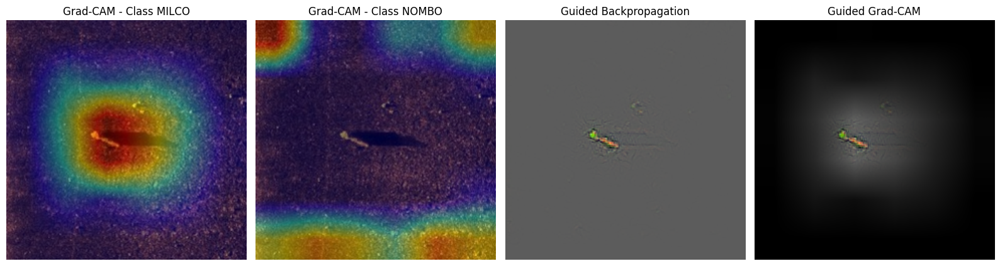

In [ ]:
# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    heatmap = np.nan_to_num(heatmap)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)
    return np.clip(heatmap,0,1)

"""
Grad-CAM heatmap often appears blurry because it is derived from a low-resolution feature map. When resized to match the original sonar image, interpolation may creates artifacts.
This should generate sharper heatmaps, making it easier to interpret.
"""
# Overlay heatmap onto image
def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation= cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    img_uint8 = np.uint8(255 * img)

    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]

# Compute Grad-CAM
def compute_gradcam(model, image, layer_name, class_index):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    weights = tf.reduce_mean(grads, axis=(1, 2))
    gradcam = tf.reduce_sum(tf.multiply(weights, conv_outputs), axis=-1).numpy()[0]
    gradcam = np.maximum(gradcam, 0)
    return normalize_heatmap(gradcam)

def modify_model_guided_backprop(model):
  @tf.custom_gradient
  def guided_relu(x):
    def grad(dy):
      return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

  def replace_relu(layer):
    if hasattr(layer,'activation') and layer.activation == tf.keras.activations.relu:
      config = layer.get_config()
      config['activation'] = guided_relu
      return layer.__class__.from_config(config)
    return layer

  gb_model = tf.keras.models.clone_model(
      model,
      clone_function=replace_relu
  )

  gb_model.set_weights(model.get_weights())
  return gb_model

# Guided Backpropagation
def guided_backprop(model, image, class_index):
    gb_model = modify_model_guided_backprop(model)

    image = tf.cast(image, tf.float32)
    image = tf.Variable(image)

    with tf.GradientTape() as tape:
        tape.watch(image)
        predictions = gb_model(image)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, image)[0].numpy()
    return normalize_heatmap(grads)

# Combine Grad-CAM and Guided Backprop
def guided_gradcam(gradcam_heatmap, guided_backprop_output):
    heatmap_resized = cv2.resize(gradcam_heatmap, (guided_backprop_output.shape[1],guided_backprop_output.shape[0]),interpolation=cv2.INTER_LINEAR)
    heatmap_resized = heatmap_resized[..., np.newaxis]

    gradcam = np.clip(heatmap_resized,0,1)

    guided_gradcam_output = guided_backprop_output * heatmap_resized
    return normalize_heatmap(guided_gradcam_output)

# Example usage:
#image_path = "/content/data/output/0023_2015_0_0.jpg"
#image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"
#image_path = "/content/data/output/0007_2015_0_0.jpg"
#image_path = "/content/data/output/0008_2015_1_0.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"
#image_path = "/content/data/output/0011_2015_0_0.jpg"

image_path = "/content/data/output/0089_2015_0_0.jpg"

rgb_img = crop_image(image_path)
input_img = rgb_img # Use RGB

input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
print("Prediction:",prediction)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

# Layer
#conv_layer_name = 'conv2d_1024' # Model A
conv_layer_name = 'conv_7b' # Model B

# Compute Grad-CAM for both class 0 and class 1
heatmap_class0 = compute_gradcam(loaded_model, input_tensor, conv_layer_name, 0)
heatmap_class1 = compute_gradcam(loaded_model, input_tensor, conv_layer_name, 1)

if predicted_class == 0:
    gradcam_heatmap = heatmap_class0
else:
    gradcam_heatmap = heatmap_class1

# Compute Guided Backpropagation
guided_bp = guided_backprop(loaded_model, input_tensor, predicted_class)

# Combine for Guided Grad-CAM
guided_gradcam_output = guided_gradcam(gradcam_heatmap, guided_bp)

# Visualization
rgb_img_normalized = rgb_img.astype(np.float32) / 255.0

visualization_class0 = show_cam_on_image(rgb_img_normalized, heatmap_class0)
visualization_class1 = show_cam_on_image(rgb_img_normalized, heatmap_class1)

plt.figure(figsize=(16,5))

# Grad-CAM for Class 0
plt.subplot(1,4,1)
plt.imshow(visualization_class0)
plt.title('Grad-CAM - Class MILCO')
plt.axis('off')

# Grad-CAM for Class 1
plt.subplot(1,4,2)
plt.imshow(visualization_class1)
plt.title('Grad-CAM - Class NOMBO')
plt.axis('off')

## Guided Backpropagation
plt.subplot(1,4,3)
plt.imshow(guided_bp)
plt.title('Guided Backpropagation')
plt.axis('off')
#
## Guided Grad-CAM
plt.subplot(1,4,4)
plt.imshow(guided_gradcam_output)
plt.title('Guided Grad-CAM')
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    heatmap = np.nan_to_num(heatmap)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)
    return np.clip(heatmap,0,1)

"""
Grad-CAM heatmap often appears blurry because it is derived from a low-resolution feature map. When resized to match the original sonar image, interpolation may creates artifacts.
This should generate sharper heatmaps, making it easier to interpret.
"""
# Overlay heatmap onto image
def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation= cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    img_uint8 = np.uint8(255 * img)

    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]

# Compute Grad-CAM
def compute_gradcam(model, image, layer_name, class_index):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    weights = tf.reduce_mean(grads, axis=(1, 2))
    gradcam = tf.reduce_sum(tf.multiply(weights, conv_outputs), axis=-1).numpy()[0]

    conv_outputs = conv_outputs.numpy()[0]
    weights = weights.numpy()[0]

    raw_gradcam = np.zeros(shape=conv_outputs.shape[:2], dtype=np.float32)
    for i, w in enumerate(weights):
      raw_gradcam += w * conv_outputs[...,i]

    gradcam = np.maximum(gradcam, 0)
    normalized_gradcam = normalize_heatmap(gradcam)
    return normalized_gradcam, gradcam, conv_outputs, weights

def modify_model_guided_backprop(model):
  @tf.custom_gradient
  def guided_relu(x):
    def grad(dy):
      return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

  def replace_relu(layer):
    if hasattr(layer,'activation') and layer.activation == tf.keras.activations.relu:
      config = layer.get_config()
      config['activation'] = guided_relu
      return layer.__class__.from_config(config)
    return layer

  gb_model = tf.keras.models.clone_model(
      model,
      clone_function=replace_relu
  )

  gb_model.set_weights(model.get_weights())
  return gb_model

# Guided Backpropagation
def guided_backprop(model, image, class_index):
    gb_model = modify_model_guided_backprop(model)

    image = tf.cast(image, tf.float32)
    image = tf.Variable(image)

    with tf.GradientTape() as tape:
        tape.watch(image)
        predictions = gb_model(image)
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, image)[0].numpy()
    return normalize_heatmap(grads)

# Combine Grad-CAM and Guided Backprop
def guided_gradcam(gradcam_heatmap, guided_backprop_output):
    heatmap_resized = cv2.resize(gradcam_heatmap, (guided_backprop_output.shape[1],guided_backprop_output.shape[0]),interpolation=cv2.INTER_LINEAR)
    heatmap_resized = heatmap_resized[..., np.newaxis]

    gradcam = np.clip(heatmap_resized,0,1)

    guided_gradcam_output = guided_backprop_output * heatmap_resized
    return normalize_heatmap(guided_gradcam_output)

def visualize_gradcam_summary(original_img, raw_gradcam, gradcam_heatmap):
    print("Original Image Shape:", original_img.shape)
    print("Raw Grad-CAM Shape:", raw_gradcam.shape)
    print("Grad-CAM Heatmap Shape:", gradcam_heatmap.shape)

    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')

    # Raw Grad-CAM (before ReLU)
    plt.subplot(1, 3, 2)
    plt.imshow(raw_gradcam)
    plt.title('Raw Grad-CAM')
    plt.axis('off')

    # Grad-CAM Heatmap (normalized, overlaid)
    overlay = show_cam_on_image(original_img.astype(np.float32) / 255.0, gradcam_heatmap)
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title('Grad-CAM Overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def canny_edge_detector(image, low_threshold=100, high_threshold=200, sigma=1.4):
    """
    Applies the Canny edge detector to an RGB or grayscale image.

    Parameters:
        image (np.array): Input RGB or grayscale image
        low_threshold (int): Lower bound for hysteresis thresholding
        high_threshold (int): Upper bound for hysteresis thresholding

    Returns:
        edges (np.array): Binary edge map
    """

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(image, (5, 5), sigma)

    # Apply Canny edge detector
    edges = cv2.Canny(blurred, threshold1=low_threshold, threshold2=high_threshold)

    return edges


# Example usage:
#image_path = "/content/data/output/0023_2015_0_0.jpg"
#image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"
#image_path = "/content/data/output/0007_2015_0_0.jpg"
#image_path = "/content/data/output/0008_2015_1_0.jpg"
image_path = "/content/data/output/0113_2015_3_1.jpg"
#image_path = "/content/data/output/0011_2015_0_0.jpg"

rgb_img = crop_image(image_path)
#input_img = convert_to_grayscale(rgb_img) # Use grayscale
input_img = rgb_img # Use RGB

input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
print("Prediction:",prediction)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

# Layer
#conv_layer_name = 'conv2d_1024' # bad model
conv_layer_name = 'conv_7b' # good model


# Compute Grad-CAM for both class 0 and class 1
heatmap_class0, raw_gradcam_class0, feature_maps_class0, weights_class0 = compute_gradcam(loaded_model, input_tensor, conv_layer_name, 0)
heatmap_class1, raw_gradcam_class1, feature_maps_class1, weights_class1 = compute_gradcam(loaded_model, input_tensor, conv_layer_name, 1)

if predicted_class == 0:
    gradcam_heatmap = heatmap_class0
else:
    gradcam_heatmap = heatmap_class1

# Compute Guided Backpropagation
guided_bp = guided_backprop(loaded_model, input_tensor, predicted_class)

# Combine for Guided Grad-CAM
guided_gradcam_output = guided_gradcam(gradcam_heatmap, guided_bp)

# Visualization
rgb_img_normalized = rgb_img.astype(np.float32) / 255.0

visualization_class0 = show_cam_on_image(rgb_img_normalized, heatmap_class0)
visualization_class1 = show_cam_on_image(rgb_img_normalized, heatmap_class1)

plt.figure(figsize=(16,5))

# Grad-CAM for Class 0
plt.subplot(1,4,1)
plt.imshow(visualization_class0)
plt.title('Grad-CAM - Class MILCO')
plt.axis('off')

# Grad-CAM for Class 1
plt.subplot(1,4,2)
plt.imshow(visualization_class1)
plt.title('Grad-CAM - Class NOMBO')
plt.axis('off')

## Guided Backpropagation
plt.subplot(1,4,3)
plt.imshow(guided_bp)
plt.title('Guided Backpropagation')
plt.axis('off')
#
## Guided Grad-CAM
plt.subplot(1,4,4)
plt.imshow(guided_gradcam_output)
plt.title('Guided Grad-CAM')
plt.axis('off')

plt.tight_layout()
plt.show()

if predicted_class == 0:
    visualize_gradcam_summary(rgb_img, raw_gradcam_class0, heatmap_class0)
else:
    visualize_gradcam_summary(rgb_img, raw_gradcam_class1, heatmap_class1)

plt.figure(figsize=(12,5))

plt.subplot(1,3,1)
plt.imshow(rgb_img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(guided_bp)
plt.title('Guided Backpropagation')
plt.axis('off')

edges = canny_edge_detector(rgb_img, low_threshold=40, high_threshold=255,sigma=1.7)
plt.subplot(1,3,3)
plt.imshow(edges, cmap="gray_r")
plt.title('Canny edge detection')
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
def process_image(image_path, model, conv_layer_name):
    # Load and preprocess
    rgb_img = crop_image(image_path)
    input_img = rgb_img.astype(np.float32)  # Use RGB
    input_tensor = preprocess_input(np.expand_dims(input_img, axis=0))

    # Prediction
    prediction = model.predict(input_tensor)
    predicted_class = np.argmax(prediction)

    # Grad-CAM
    heatmap_class0 = compute_gradcam(model, input_tensor, conv_layer_name, 0)
    heatmap_class1 = compute_gradcam(model, input_tensor, conv_layer_name, 1)
    gradcam_heatmap = heatmap_class0 if predicted_class == 0 else heatmap_class1

    # Guided Backprop
    guided_bp = guided_backprop(model, input_tensor, predicted_class)

    # Guided Grad-CAM
    guided_gradcam_output = guided_gradcam(gradcam_heatmap, guided_bp)

    # Visualization
    rgb_img_normalized = rgb_img / 255.0
    visualization_class0 = show_cam_on_image(rgb_img_normalized, heatmap_class0)
    visualization_class1 = show_cam_on_image(rgb_img_normalized, heatmap_class1)

    return {
        "path": image_path,
        "prediction": prediction,
        "predicted_class": predicted_class,
        "visualization_class0": visualization_class0,
        "visualization_class1": visualization_class1,
        "guided_bp": guided_bp,
        "guided_gradcam": guided_gradcam_output
    }

image_paths = [
    "/content/data/output/0003_2015_1_1.jpg",
    "/content/data/output/0006_2015_2_1.jpg",
    "/content/data/output/0007_2015_0_0.jpg",
    "/content/data/output/0008_2015_2_0.jpg",
    "/content/data/output/0009_2015_0_1.jpg",

    "/content/data/output/0011_2015_0_0.jpg",
    "/content/data/output/0017_2015_1_1.jpg",
    "/content/data/output/0019_2015_1_1.jpg",
    "/content/data/output/0021_2015_0_0.jpg",
    "/content/data/output/0023_2015_0_0.jpg",

    "/content/data/output/0031_2015_0_0.jpg",
    "/content/data/output/0032_2015_0_1.jpg",
    "/content/data/output/0037_2015_0_0.jpg",
    "/content/data/output/0074_2015_3_1.jpg",
    "/content/data/output/0113_2015_3_1.jpg",

    "/content/data/output/0014_2017_0_0.jpg",
    "/content/data/output/0371_2018_0_0.jpg",
    "/content/data/output/0011_2021_2_0.jpg",
    "/content/data/output/0016_2021_1_0.jpg",
    "/content/data/output/0020_2021_1_0.jpg"
]

conv_layer_name = 'conv2d_1024' # bad model

for path in image_paths:
    result = process_image(path, loaded_model, conv_layer_name)

    print(f"Image: {result['path']}")
    print("Prediction:", result["prediction"])
    print("Predicted Class:", result["predicted_class"])

    # Plot results
    plt.figure(figsize=(16,5))
    plt.subplot(1,4,1)
    plt.imshow(result["visualization_class0"])
    plt.title('Grad-CAM - Class MILCO')
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(result["visualization_class1"])
    plt.title('Grad-CAM - Class NOMBO')
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(result["guided_bp"])
    plt.title('Guided Backpropagation')
    plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(result["guided_gradcam"])
    plt.title('Guided Grad-CAM')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## Score Class Activation Map (Score-CAM)

In [ ]:
loaded_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ image_input (InputLayer)  │ (None, 240, 240, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_820 (Conv2D)       │ (None, 119, 119, 32)   │            864 │ image_input[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_820   │ (None, 119, 119, 32)   │             96 │ conv2d_820[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_812            │ (None, 119, 119, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_821 (Conv2D)       │ (None, 117, 117, 32)   │          9,216 │ activation_812[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_821   │ (None, 117, 117, 32)   │             96 │ conv2d_821[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_813            │ (None, 117, 117, 32)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_822 (Conv2D)       │ (None, 117, 117, 64)   │         18,432 │ activation_813[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_822   │ (None, 117, 117, 64)   │            192 │ conv2d_822[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_814            │ (None, 117, 117, 64)   │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_24          │ (None, 58, 58, 64)     │              0 │ activation_814[0][0]   │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_823 (Conv2D)       │ (None, 58, 58, 80)     │          5,120 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_823   │ (None, 58, 58, 80)     │            240 │ conv2d_823[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_815            │ (None, 58, 58, 80)     │              0 │ batch_normalization_8… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_824 (Conv2D)       │ (None, 56, 56, 192)    │        138,240 │ activation_815[0][0]   │
├──────────────────────

 Total params: 57,412,776 (219.01 MB)

 Trainable params: 1,025,218 (3.91 MB)

 Non-trainable params: 54,337,120 (207.28 MB)

 Optimizer params: 2,050,438 (7.82 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step
Prediction: [[9.9986732e-01 1.3268138e-04]]
Predicted class: 0
1536
Score-CAM computation took 1021.56 seconds with n_maps=1536 feature maps.


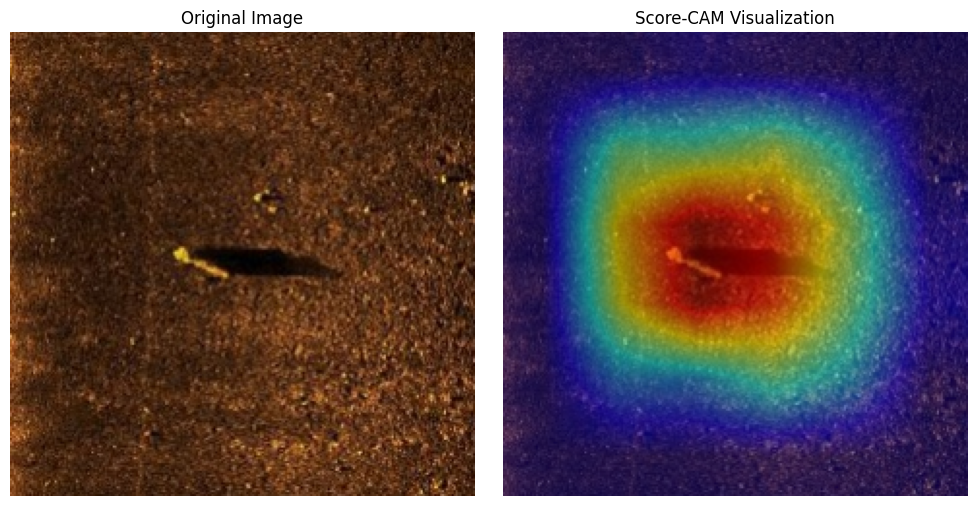

In [ ]:
# Standard Score-CAM
import time

# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    return (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]


def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    #heatmap_resized = upscale_heatmap(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation= cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    img_uint8 = np.uint8(255 * img)

    #overlay = cv2.addWeighted(np.uint8(255 * img), 1 - alpha, heatmap_colored, alpha, 0)
    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Convert RGB image to grayscale
def convert_to_grayscale(image):
    grayscale_image = tf.image.rgb_to_grayscale(image)
    return tf.image.grayscale_to_rgb(grayscale_image).numpy()


# Function to compute Score-CAM
def score_cam(model, img_array, layer_name, class_index=None):
    start_time = time.time()
    target_layer = model.get_layer(layer_name)
    cam_model = tf.keras.Model(inputs=model.input, outputs=[target_layer.output, model.output])

    activation_maps, predictions = cam_model(img_array)
    activation_maps = activation_maps[0].numpy()

    if class_index is None:
        class_index = np.argmax(predictions[0])

    n_maps = activation_maps.shape[-1]
    input_shape = img_array.shape[1:3]
    score_weights = []

    print(n_maps)

    for i in range(n_maps):
      act_map = activation_maps[:,:,i]
      act_map_revised = cv2.resize(act_map, input_shape, interpolation=cv2.INTER_LINEAR)
      act_map_normalized = normalize_heatmap(act_map_revised)

      # Mask the input image
      masked_input = img_array.copy()
      masked_input[0] *= np.expand_dims(act_map_normalized,axis=-1)

      # Forward pass
      pred_masked = model.predict(masked_input,verbose=0)
      score_weights.append(pred_masked[0][class_index])

    score_weights = np.maximum(score_weights, 0)

    # Compute final CAM
    score_cam_map = np.zeros(activation_maps.shape[:2], dtype = np.float32)
    for i, weight in enumerate(score_weights):
      score_cam_map += weight * activation_maps[:,:,i]

    score_cam_map = np.maximum(score_cam_map, 0)
    score_cam_map /= (np.max(score_cam_map) + 1e-8)

    elapsed_time = time.time() - start_time
    print(f"Score-CAM computation took {elapsed_time:.2f} seconds with n_maps={n_maps} feature maps.")

    return score_cam_map

# Define image path
#image_path = '/content/data/output/0023_2015_0_0.jpg'
#image_path = '/content/data/output/0007_2015_0_0.jpg'
#image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0074_2015_3_1.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"
image_path = "/content/data/output/0089_2015_0_0.jpg"


rgb_img = crop_image(image_path)
#input_img = convert_to_grayscale(rgb_img) # Use grayscale
input_img = rgb_img # Use RGB
input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
print("Prediction:",prediction)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

#conv_layer_name = 'conv2d_1024' # bad model
conv_layer_name = 'conv_7b' # good model

# Generate Score-CAM heatmap
score_cam_heatmap = score_cam(loaded_model, input_tensor, conv_layer_name, predicted_class)

score_cam_image = show_cam_on_image(rgb_img / 255.0, score_cam_heatmap, alpha=0.5)


# Plot original and Score-CAM images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(rgb_img)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(score_cam_image)
axes[1].set_title("Score-CAM Visualization")
axes[1].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
Prediction: [[9.9994564e-01 5.4334476e-05]]
Predicted class: 0
200
Score-CAM computation took 145.05 seconds with top_k=200 feature maps.


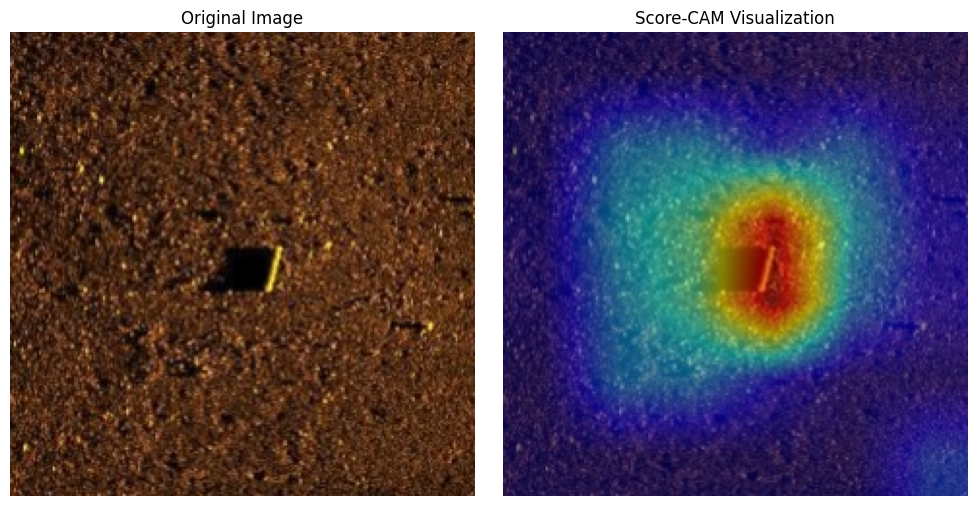

In [ ]:
# Score-CAM
# Using only activation maps with high variance
# High-variance activation maps usually represent significant patterns in the data
# Choose only top-k maps by variance (or mean activation)
import time

# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    return (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]


def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    #heatmap_resized = upscale_heatmap(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation= cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    img_uint8 = np.uint8(255 * img)

    #overlay = cv2.addWeighted(np.uint8(255 * img), 1 - alpha, heatmap_colored, alpha, 0)
    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Convert RGB image to grayscale
def convert_to_grayscale(image):
    grayscale_image = tf.image.rgb_to_grayscale(image)
    return tf.image.grayscale_to_rgb(grayscale_image).numpy()

# Function to compute Score-CAM
def score_cam(model, img_array, layer_name, class_index=None, top_k = 200):
    start_time = time.time()

    target_layer = model.get_layer(layer_name)
    cam_model = tf.keras.Model(inputs=model.input, outputs=[target_layer.output, model.output])

    activation_maps, predictions = cam_model(img_array)
    activation_maps = activation_maps[0].numpy()

    if class_index is None:
        class_index = np.argmax(predictions[0])

    # Compute variance and select top-k activation maps
    variances = np.var(activation_maps, axis=(0,1))
    top_indices = np.argsort(variances)[-top_k:]

    activation_maps_subset = activation_maps[:,:,top_indices]
    n_maps = activation_maps_subset.shape[-1]
    input_shape = img_array.shape[1:3]

    score_weights = []

    print(n_maps)

    for i in range(n_maps):
      act_map = activation_maps_subset[:,:,i]
      act_map_revised = cv2.resize(act_map, input_shape, interpolation=cv2.INTER_LINEAR)
      act_map_normalized = normalize_heatmap(act_map_revised)

      # Mask the input image
      masked_input = img_array.copy()
      masked_input[0] *= np.expand_dims(act_map_normalized,axis=-1)

      # Forward pass
      pred_masked = model.predict(masked_input,verbose=0)
      score_weights.append(pred_masked[0][class_index])

    score_weights = np.maximum(score_weights, 0)

    # Compute final CAM
    score_cam_map = np.zeros(activation_maps_subset.shape[:2], dtype = np.float32)
    for i, weight in enumerate(score_weights):
      score_cam_map += weight * activation_maps_subset[:,:,i]

    score_cam_map = np.maximum(score_cam_map, 0)
    score_cam_map /= (np.max(score_cam_map) + 1e-8)

    elapsed_time = time.time() - start_time
    print(f"Score-CAM computation took {elapsed_time:.2f} seconds with top_k={top_k} feature maps.")

    return score_cam_map

# Define image path
#image_path = '/content/data/output/0023_2015_0_0.jpg'
#image_path = '/content/data/output/0007_2015_0_0.jpg'
image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0074_2015_3_1.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"


rgb_img = crop_image(image_path)
#input_img = convert_to_grayscale(rgb_img) # Use grayscale
input_img = rgb_img # Use RGB
input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
print("Prediction:",prediction)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

# Generate Score-CAM heatmap
score_cam_heatmap = score_cam(loaded_model, input_tensor, 'conv_7b', predicted_class)

score_cam_image = show_cam_on_image(rgb_img / 255.0, score_cam_heatmap, alpha=0.5)


# Plot original and Score-CAM images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(rgb_img)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(score_cam_image)
axes[1].set_title("Score-CAM Visualization")
axes[1].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
Running Score-CAM for top_k=10
10
Score-CAM computation took 11.68 seconds with top_k=10 feature maps.
Running Score-CAM for top_k=25
25
Score-CAM computation took 18.38 seconds with top_k=25 feature maps.
Running Score-CAM for top_k=50
50
Score-CAM computation took 33.05 seconds with top_k=50 feature maps.
Running Score-CAM for top_k=100
100
Score-CAM computation took 67.97 seconds with top_k=100 feature maps.
Running Score-CAM for top_k=200
200
Score-CAM computation took 132.92 seconds with top_k=200 feature maps.
Running Score-CAM for top_k=None
1536
Score-CAM computation took 963.95 seconds with top_k=1536 feature maps.


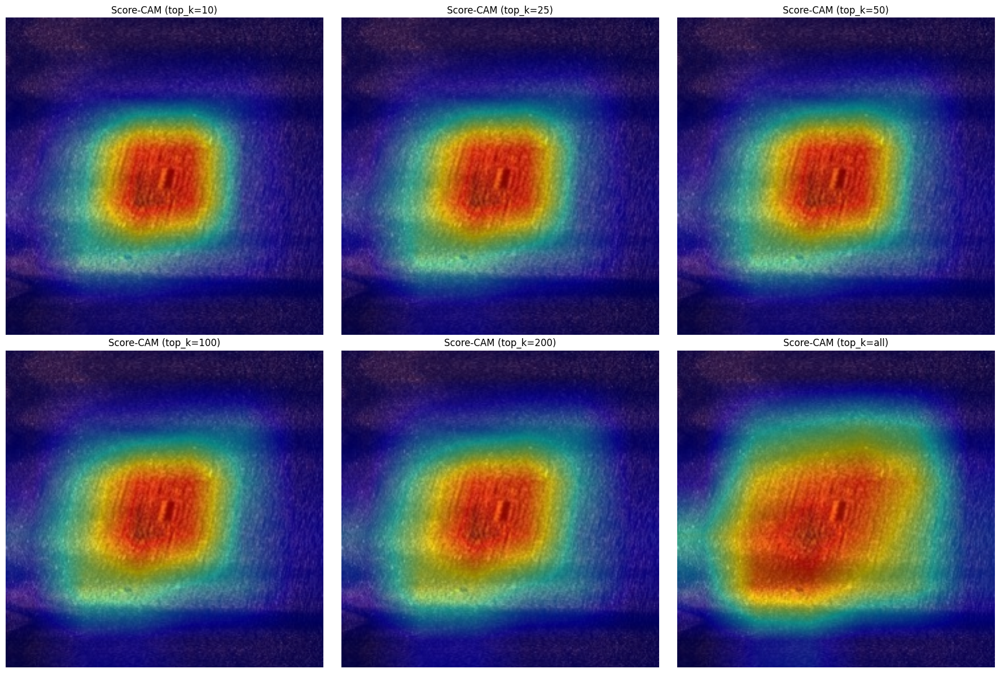

In [ ]:
# Test for various k values
top_k_values = [10, 25, 50, 100, 200, None]  # None indicates using all maps

#image_path = "/content/data/output/0037_2015_0_0.jpg"
image_path = "/content/data/output/0371_2018_0_0.jpg"

rgb_img = crop_image(image_path)
input_img = rgb_img
input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
predicted_class = np.argmax(prediction)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, top_k in enumerate(top_k_values):
    print(f"Running Score-CAM for top_k={top_k}")

    if top_k is None:
        layer_output = loaded_model.get_layer('conv_7b').output
        n_feature_maps = layer_output.shape[-1]
        current_k = n_feature_maps
    else:
        current_k = top_k

    score_cam_heatmap = score_cam(loaded_model, input_tensor, 'conv_7b', predicted_class, top_k=current_k)

    score_cam_image = show_cam_on_image(rgb_img / 255.0, score_cam_heatmap, alpha=0.5)

    axes[idx].imshow(score_cam_image)
    axes[idx].axis('off')
    axes[idx].set_title(f'Score-CAM (top_k={"all" if top_k is None else top_k})')

plt.tight_layout()
plt.show()

In [ ]:
import time

# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    return (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]

# Overlay CAM on image
def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    img_uint8 = np.uint8(255 * img)
    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Score-CAM function
def score_cam(model, img_array, layer_name, class_index=None, top_k=100):
    start_time = time.time()
    target_layer = model.get_layer(layer_name)
    cam_model = tf.keras.Model(inputs=model.input, outputs=[target_layer.output, model.output])

    activation_maps, predictions = cam_model(img_array)
    activation_maps = activation_maps[0].numpy()

    if class_index is None:
        class_index = np.argmax(predictions[0])

    variances = np.var(activation_maps, axis=(0, 1))
    top_indices = np.argsort(variances)[-top_k:]
    activation_maps_subset = activation_maps[:, :, top_indices]

    input_shape = img_array.shape[1:3]
    score_weights = []

    for i in range(top_k):
        act_map = activation_maps_subset[:, :, i]
        act_map_resized = cv2.resize(act_map, input_shape, interpolation=cv2.INTER_LINEAR)
        act_map_normalized = normalize_heatmap(act_map_resized)
        masked_input = img_array.copy()
        masked_input[0] *= np.expand_dims(act_map_normalized, axis=-1)
        pred_masked = model.predict(masked_input, verbose=0)
        score_weights.append(pred_masked[0][class_index])

    score_weights = np.maximum(score_weights, 0)
    score_cam_map = np.zeros(activation_maps_subset.shape[:2], dtype=np.float32)
    for i, weight in enumerate(score_weights):
        score_cam_map += weight * activation_maps_subset[:, :, i]

    score_cam_map = np.maximum(score_cam_map, 0)
    score_cam_map /= (np.max(score_cam_map) + 1e-8)

    elapsed_time = time.time() - start_time
    print(f"Score-CAM computation took {elapsed_time:.2f} seconds with top_k={top_k} feature maps.")
    return score_cam_map

# Main function to run Score-CAM on an image
def run_score_cam_on_image(model, image_path, layer_name='conv_7b', crop_size=240, top_k=100):
    rgb_img = crop_image(image_path, crop_size=crop_size)
    input_tensor = preprocess_input(np.expand_dims(rgb_img.astype(np.float32), axis=0))

    prediction = model.predict(input_tensor)
    predicted_class = np.argmax(prediction[0])
    print(f"Image: {image_path}")
    print("Prediction:", prediction)
    print("Predicted class:", predicted_class)

    heatmap = score_cam(model, input_tensor, layer_name, predicted_class, top_k=top_k)
    score_cam_image = show_cam_on_image(rgb_img / 255.0, heatmap, alpha=0.5)

    # Display
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(rgb_img)
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    axes[1].imshow(score_cam_image)
    axes[1].set_title("Score-CAM Visualization")
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

image_paths = [
    "/content/data/output/0003_2015_1_1.jpg",
    "/content/data/output/0006_2015_2_1.jpg",
    "/content/data/output/0007_2015_0_0.jpg",
    "/content/data/output/0008_2015_2_0.jpg",
    "/content/data/output/0009_2015_0_1.jpg",

    "/content/data/output/0011_2015_0_0.jpg",
    "/content/data/output/0017_2015_1_1.jpg",
    "/content/data/output/0019_2015_1_1.jpg",
    "/content/data/output/0021_2015_0_0.jpg",
    "/content/data/output/0023_2015_0_0.jpg",

    "/content/data/output/0031_2015_0_0.jpg",
    "/content/data/output/0032_2015_0_1.jpg",
    "/content/data/output/0037_2015_0_0.jpg",
    "/content/data/output/0074_2015_3_1.jpg",
    "/content/data/output/0113_2015_3_1.jpg",

    "/content/data/output/0014_2017_0_0.jpg",
    "/content/data/output/0371_2018_0_0.jpg",
    "/content/data/output/0011_2021_2_0.jpg",
    "/content/data/output/0016_2021_1_0.jpg",
    "/content/data/output/0020_2021_1_0.jpg"
]

for path in image_paths:
    run_score_cam_on_image(loaded_model, path)

In [ ]:
# Score-CAM
import time

# Normalize heatmap
def normalize_heatmap(heatmap, epsilon=1e-8):
    return (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + epsilon)

# Crop and preprocess image
def crop_image(image_path, crop_size=240):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    start = (299 - crop_size) // 2
    return image[start:start+crop_size, start:start+crop_size]


def show_cam_on_image(img, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    #heatmap_resized = upscale_heatmap(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation= cv2.INTER_LINEAR)
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    img_uint8 = np.uint8(255 * img)

    #overlay = cv2.addWeighted(np.uint8(255 * img), 1 - alpha, heatmap_colored, alpha, 0)
    overlay = cv2.addWeighted(img_uint8, 1 - alpha, heatmap_colored, alpha, 0)
    return overlay

# Convert RGB image to grayscale
def convert_to_grayscale(image):
    grayscale_image = tf.image.rgb_to_grayscale(image)
    return tf.image.grayscale_to_rgb(grayscale_image).numpy()

# Function to compute Score-CAM
def score_cam_vis(model, img_array, layer_name, class_index=None, top_k = 10):
    start_time = time.time()

    target_layer = model.get_layer(layer_name)
    cam_model = tf.keras.Model(inputs=model.input, outputs=[target_layer.output, model.output])

    activation_maps, predictions = cam_model(img_array)
    activation_maps = activation_maps[0].numpy()

    if class_index is None:
        class_index = np.argmax(predictions[0])

    # Compute variance and select top-k activation maps
    variances = np.var(activation_maps, axis=(0,1))
    top_indices = np.argsort(variances)[-top_k:]

    activation_maps_subset = activation_maps[:,:,top_indices]
    n_maps = activation_maps_subset.shape[-1]
    input_shape = img_array.shape[1:3]

    score_weights = []

    print(n_maps)

    for i in range(n_maps):
      act_map = activation_maps_subset[:,:,i]
      act_map_revised = cv2.resize(act_map, input_shape, interpolation=cv2.INTER_LINEAR)
      act_map_normalized = normalize_heatmap(act_map_revised)

      # Mask the input image
      masked_input = img_array.copy()
      masked_input[0] *= np.expand_dims(act_map_normalized,axis=-1)

      # Forward pass
      pred_masked = model.predict(masked_input,verbose=0)
      score_weights.append(pred_masked[0][class_index])

    score_weights = np.maximum(score_weights, 0)

    # Compute final CAM
    score_cam_map = np.zeros(activation_maps_subset.shape[:2], dtype = np.float32)
    for i, weight in enumerate(score_weights):
      score_cam_map += weight * activation_maps_subset[:,:,i]

    score_cam_map = np.maximum(score_cam_map, 0)
    score_cam_map /= (np.max(score_cam_map) + 1e-8)

    elapsed_time = time.time() - start_time
    print(f"Score-CAM computation took {elapsed_time:.2f} seconds with top_k={top_k} feature maps.")

    return score_cam_map, activation_maps, variances

# Define image path
#image_path = '/content/data/output/0023_2015_0_0.jpg'
#image_path = '/content/data/output/0007_2015_0_0.jpg'
image_path = "/content/data/output/0037_2015_0_0.jpg"
#image_path = "/content/data/output/0074_2015_3_1.jpg"
#image_path = "/content/data/output/0021_2015_0_0.jpg"


rgb_img = crop_image(image_path)
#input_img = convert_to_grayscale(rgb_img) # Use grayscale
input_img = rgb_img # Use RGB
input_tensor = preprocess_input(np.expand_dims(input_img.astype(np.float32), axis=0))

prediction = loaded_model.predict(input_tensor)
print("Prediction:",prediction)
predicted_class = np.argmax(prediction)
print("Predicted class:", predicted_class)

# Generate Score-CAM heatmap
score_cam_heatmap, activation_maps, variances = score_cam_vis(loaded_model, input_tensor, 'conv_7b', predicted_class)

score_cam_image = show_cam_on_image(rgb_img / 255.0, score_cam_heatmap, alpha=0.5)

# Visualize low and high variance feature maps

amount_k = 5
low_indices = np.argsort(variances)[:amount_k]
high_indices = np.argsort(variances)[-amount_k:]

def visualize_feature_maps(maps, indices, title):
    fig, axs = plt.subplots(1, len(indices), figsize=(3*len(indices), 3))
    if len(indices) == 1:
        axs = [axs]
    for i, idx in enumerate(indices):
        axs[i].imshow(maps[:, :, idx], cmap='viridis')
        axs[i].set_title(f'Feature Map {idx}')
        axs[i].axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Visualize top 5 low-variance maps
visualize_feature_maps(activation_maps, low_indices, 'Top 5 Low-Variance Feature Maps')

# Visualize top 5 high-variance maps
visualize_feature_maps(activation_maps, high_indices, 'Top 5 High-Variance Feature Maps')

def overlay_feature_map_on_image(image, fmap, alpha=0.5, cmap='jet'):
    """
    Overlay a single feature map on top of an image.
    """
    fmap_resized = cv2.resize(fmap, (image.shape[1], image.shape[0]))
    fmap_norm = (fmap_resized - np.min(fmap_resized)) / (np.max(fmap_resized) - np.min(fmap_resized) + 1e-8)
    heatmap = cv2.applyColorMap(np.uint8(255 * fmap_norm), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(np.uint8(image), 1 - alpha, heatmap, alpha, 0)
    return overlay

def show_overlay_grid(image, activation_maps, indices, title):
    fig, axs = plt.subplots(1, len(indices), figsize=(4 * len(indices), 4))
    if len(indices) == 1:
        axs = [axs]
    for i, idx in enumerate(indices):
        fmap = activation_maps[:, :, idx]
        overlay = overlay_feature_map_on_image(image, fmap)
        axs[i].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
        axs[i].set_title(f'Feature Map {idx}')
        axs[i].axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

img_overlay = (rgb_img / 255.0).astype(np.float32)

# Visualize top 5 low-variance maps
show_overlay_grid(img_overlay, activation_maps, low_indices, 'Top 5 Low-Variance Feature Maps')

# Visualize top 5 high-variance maps
show_overlay_grid(img_overlay, activation_maps, high_indices, 'Top 5 High-Variance Feature Maps')